In [116]:
#!pip install fastai -Uqq
#!pip install -Uqq openpyxl

In [117]:
import torch, numpy as np, pandas as pd
np.set_printoptions(linewidth=140)
torch.set_printoptions(linewidth=140, sci_mode=False, edgeitems=7)
pd.set_option('display.width', 140)
from IPython.display import display

In [118]:
#import glob
#filenames = glob.glob('./uHoo/*.xlsx')
dirpath = './uHoo/'

import os
from pathlib import Path
paths = sorted(Path(dirpath).glob("*.xlsx"), key=os.path.getmtime)

rawdf = pd.concat([pd.read_excel(f, header=None) for f in paths])
rawdf

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,Date/time,Instance,Sensor,Value,Units,Temperature,Humidity,PM2.5,CO2,CO,TVOC,NO2,Ozone,Pressure
1,"February 15, 2020 at 04:19PM",Walnut,Air Pressure,1010.97,mbar,21.4,33.9,7.9,807,0,53,21.9,7.9,1011
2,"February 15, 2020 at 04:20PM",Walnut,Air Pressure,1011,mbar,21.4,33.9,7.9,808,0,55,22.1,7.9,1011
3,"February 15, 2020 at 04:23PM",Walnut,Air Pressure,1011.07,mbar,21.4,33.8,7.3,808,0,55,21.1,7.8,1011.1
4,"February 15, 2020 at 04:24PM",Walnut,Air Pressure,1011.1,mbar,21.4,33.9,7.6,812,0,55,22.4,7.9,1011.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1599,"March 1, 2022 at 05:08AM",Walnut,Air Pressure,1009.21,mbar,17.9,33.1,5,457,0,20,53.1,9.7,1009.2
1600,"March 1, 2022 at 05:09AM",Walnut,Air Pressure,1009.15,mbar,17.9,32.3,5,461,0,20,52.3,9.6,1009.1
1601,"March 1, 2022 at 06:06AM",Walnut,Air Pressure,1008.82,mbar,17.9,30.5,8,463,0,41,58.5,9.8,1008.8
1602,"March 1, 2022 at 06:07AM",Walnut,Air Pressure,1008.85,mbar,17.8,31.5,5,462,0,41,55.6,9.7,1008.9


In [119]:
from datetime import datetime
format="%B %d, %Y at %I:%M%p"
d = datetime.strptime("March 10, 2021 at 05:10PM", format)
print(d)
print(dir(d))
print(d.strftime("%A"))

2021-03-10 17:10:00
['__add__', '__class__', '__delattr__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__ne__', '__new__', '__radd__', '__reduce__', '__reduce_ex__', '__repr__', '__rsub__', '__setattr__', '__sizeof__', '__str__', '__sub__', '__subclasshook__', 'astimezone', 'combine', 'ctime', 'date', 'day', 'dst', 'fold', 'fromisocalendar', 'fromisoformat', 'fromordinal', 'fromtimestamp', 'hour', 'isocalendar', 'isoformat', 'isoweekday', 'max', 'microsecond', 'min', 'minute', 'month', 'now', 'replace', 'resolution', 'second', 'strftime', 'strptime', 'time', 'timestamp', 'timetuple', 'timetz', 'today', 'toordinal', 'tzinfo', 'tzname', 'utcfromtimestamp', 'utcnow', 'utcoffset', 'utctimetuple', 'weekday', 'year']
Wednesday


In [120]:
df = rawdf.copy()

# turn first row into column labels
df.columns = df.iloc[0]

# Drop the column data row
df = df.iloc[1:]

# Drop useless columns
df = df.drop(['Instance', 'Sensor', 'Value', 'Units'], axis=1)

# Convert first column to date type
df['Date/time'] = pd.to_datetime(df['Date/time'], format="%B %d, %Y at %I:%M%p")

# Convert everything else to numeric
numeric_cols = ['Temperature','Humidity','PM2.5','CO2','CO','TVOC','NO2','Ozone','Pressure']
df[numeric_cols] = df[numeric_cols].apply(pd.to_numeric)

# Renumber from zero
df = df.reset_index(drop=True)

df

,Date/time,Temperature,Humidity,PM2.5,CO2,CO,TVOC,NO2,Ozone,Pressure
0,2020-02-15 16:19:00,21.4,33.9,7.9,807,0.0,53,21.9,7.9,1011.0
1,2020-02-15 16:20:00,21.4,33.9,7.9,808,0.0,55,22.1,7.9,1011.0
2,2020-02-15 16:23:00,21.4,33.8,7.3,808,0.0,55,21.1,7.8,1011.1
3,2020-02-15 16:24:00,21.4,33.9,7.6,812,0.0,55,22.4,7.9,1011.1
4,2020-02-15 16:25:00,21.4,33.9,7.4,813,0.0,54,21.5,7.9,1011.1
...,...,...,...,...,...,...,...,...,...,...
52676,2022-03-01 05:08:00,17.9,33.1,5.0,457,0.0,20,53.1,9.7,1009.2
52677,2022-03-01 05:09:00,17.9,32.3,5.0,461,0.0,20,52.3,9.6,1009.1
52678,2022-03-01 06:06:00,17.9,30.5,8.0,463,0.0,41,58.5,9.8,1008.8
52679,2022-03-01 06:07:00,17.8,31.5,5.0,462,0.0,41,55.6,9.7,1008.9


In [121]:
df.describe()

,Temperature,Humidity,PM2.5,CO2,CO,TVOC,NO2,Ozone,Pressure
count,52681.000000,52681.000000,52681.000000,52681.000000,52681.000000,52681.000000,52681.000000,52681.000000,52681.000000
mean,21.636465,41.753378,2.310634,754.625368,0.014210,151.947419,17.925527,7.790251,1000.667227
std,1.762421,10.921825,2.813047,201.405182,0.178755,229.485451,21.146656,0.997603,7.259274
min,12.500000,10.700000,1.000000,400.000000,0.000000,0.000000,0.000000,3.600000,971.800000
25%,21.400000,31.800000,1.000000,569.000000,0.000000,24.000000,0.800000,7.100000,996.000000
50%,22.100000,42.100000,1.000000,775.000000,0.000000,70.000000,10.200000,7.600000,1000.200000
75%,22.700000,51.300000,3.000000,900.000000,0.000000,171.000000,27.900000,8.100000,1005.400000
max,27.400000,82.000000,123.200000,2050.000000,7.900000,1200.000000,181.400000,13.600000,1025.200000


In [122]:
#df['Weekday']=df['Date/time'].apply(lambda d:d.strftime("%A"))
#df

In [123]:
#df = pd.get_dummies(df, columns=["Weekday"])
#df.columns

<AxesSubplot: xlabel='Date/time'>

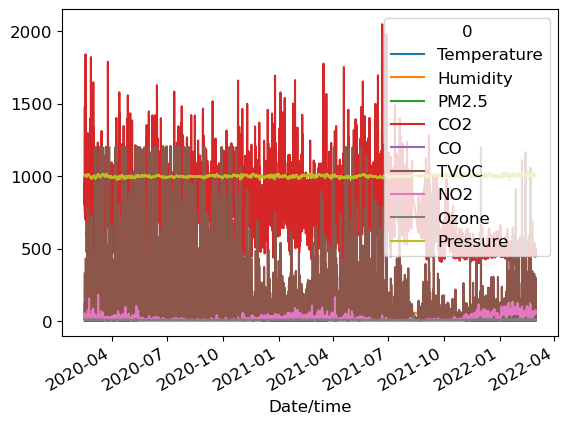

In [124]:
# Set date/time index
df = df.set_index('Date/time')
df['datetime'] = df.index
df[numeric_cols].plot.line()

<AxesSubplot: xlabel='Date/time'>

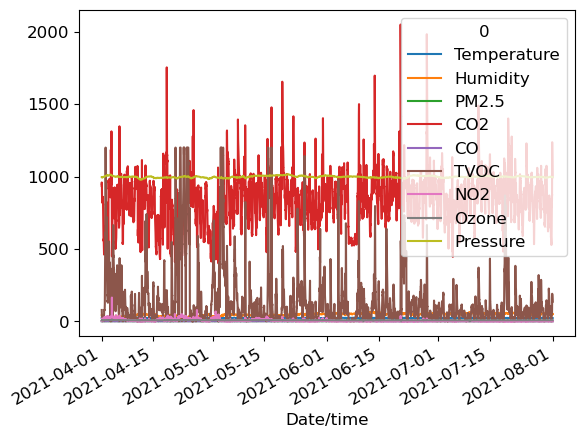

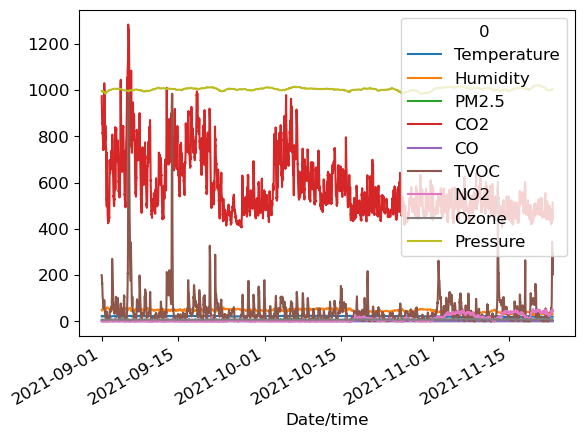

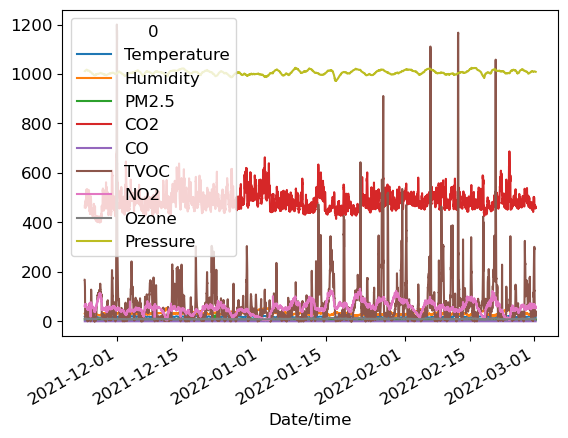

In [125]:
# 3 sensor locations 
df1 = df[(df['datetime'] >= '2021-04-01') & (df['datetime'] < '2021-08-01')]
df2 = df[(df['datetime'] >= '2021-09-01') & (df['datetime'] < '2021-11-23')]
df3 = df[(df['datetime'] >= '2021-11-24')]

df1[numeric_cols].plot.line()
df2[numeric_cols].plot.line()
df3[numeric_cols].plot.line()

In [126]:
df3

,Temperature,Humidity,PM2.5,CO2,CO,TVOC,NO2,Ozone,Pressure,datetime
Date/time,,,,,,,,,,
2021-11-24 00:06:00,17.7,30.3,7.0,461,0.0,168,60.3,9.9,1012.0,2021-11-24 00:06:00
2021-11-24 00:07:00,17.6,30.2,4.0,465,0.0,168,59.1,9.8,1012.1,2021-11-24 00:07:00
2021-11-24 00:08:00,17.7,30.7,4.0,469,0.0,165,58.8,9.8,1012.0,2021-11-24 00:08:00
2021-11-24 01:07:00,17.2,29.5,5.0,469,0.0,141,67.8,10.2,1012.3,2021-11-24 01:07:00
2021-11-24 01:08:00,17.1,29.3,5.0,469,0.0,141,68.8,10.3,1012.3,2021-11-24 01:08:00
...,...,...,...,...,...,...,...,...,...,...
2022-03-01 05:08:00,17.9,33.1,5.0,457,0.0,20,53.1,9.7,1009.2,2022-03-01 05:08:00
2022-03-01 05:09:00,17.9,32.3,5.0,461,0.0,20,52.3,9.6,1009.1,2022-03-01 05:09:00
2022-03-01 06:06:00,17.9,30.5,8.0,463,0.0,41,58.5,9.8,1008.8,2022-03-01 06:06:00


In [127]:
from fastai.tabular.core import add_datepart
dfall = df3.copy()
add_datepart(dfall, 'datetime', drop=False)


,Temperature,Humidity,PM2.5,CO2,CO,TVOC,NO2,Ozone,Pressure,datetime,datetimeYear,datetimeMonth,datetimeWeek,datetimeDay,datetimeDayofweek,datetimeDayofyear,datetimeIs_month_end,datetimeIs_month_start,datetimeIs_quarter_end,datetimeIs_quarter_start,datetimeIs_year_end,datetimeIs_year_start,datetimeElapsed
Date/time,,,,,,,,,,,,,,,,,,,,,,,
2021-11-24 00:06:00,17.7,30.3,7.0,461,0.0,168,60.3,9.9,1012.0,2021-11-24 00:06:00,2021,11,47,24,2,328,False,False,False,False,False,False,1.637712e+09
2021-11-24 00:07:00,17.6,30.2,4.0,465,0.0,168,59.1,9.8,1012.1,2021-11-24 00:07:00,2021,11,47,24,2,328,False,False,False,False,False,False,1.637712e+09
2021-11-24 00:08:00,17.7,30.7,4.0,469,0.0,165,58.8,9.8,1012.0,2021-11-24 00:08:00,2021,11,47,24,2,328,False,False,False,False,False,False,1.637712e+09
2021-11-24 01:07:00,17.2,29.5,5.0,469,0.0,141,67.8,10.2,1012.3,2021-11-24 01:07:00,2021,11,47,24,2,328,False,False,False,False,False,False,1.637716e+09
2021-11-24 01:08:00,17.1,29.3,5.0,469,0.0,141,68.8,10.3,1012.3,2021-11-24 01:08:00,2021,11,47,24,2,328,False,False,False,False,False,False,1.637716e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-01 05:08:00,17.9,33.1,5.0,457,0.0,20,53.1,9.7,1009.2,2022-03-01 05:08:00,2022,3,9,1,1,60,False,True,False,False,False,False,1.646111e+09
2022-03-01 05:09:00,17.9,32.3,5.0,461,0.0,20,52.3,9.6,1009.1,2022-03-01 05:09:00,2022,3,9,1,1,60,False,True,False,False,False,False,1.646111e+09
2022-03-01 06:06:00,17.9,30.5,8.0,463,0.0,41,58.5,9.8,1008.8,2022-03-01 06:06:00,2022,3,9,1,1,60,False,True,False,False,False,False,1.646115e+09


In [128]:
dfall.reset_index(drop=True, inplace=True)
dfall


,Temperature,Humidity,PM2.5,CO2,CO,TVOC,NO2,Ozone,Pressure,datetime,datetimeYear,datetimeMonth,datetimeWeek,datetimeDay,datetimeDayofweek,datetimeDayofyear,datetimeIs_month_end,datetimeIs_month_start,datetimeIs_quarter_end,datetimeIs_quarter_start,datetimeIs_year_end,datetimeIs_year_start,datetimeElapsed
0,17.7,30.3,7.0,461,0.0,168,60.3,9.9,1012.0,2021-11-24 00:06:00,2021,11,47,24,2,328,False,False,False,False,False,False,1.637712e+09
1,17.6,30.2,4.0,465,0.0,168,59.1,9.8,1012.1,2021-11-24 00:07:00,2021,11,47,24,2,328,False,False,False,False,False,False,1.637712e+09
2,17.7,30.7,4.0,469,0.0,165,58.8,9.8,1012.0,2021-11-24 00:08:00,2021,11,47,24,2,328,False,False,False,False,False,False,1.637712e+09
3,17.2,29.5,5.0,469,0.0,141,67.8,10.2,1012.3,2021-11-24 01:07:00,2021,11,47,24,2,328,False,False,False,False,False,False,1.637716e+09
4,17.1,29.3,5.0,469,0.0,141,68.8,10.3,1012.3,2021-11-24 01:08:00,2021,11,47,24,2,328,False,False,False,False,False,False,1.637716e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6906,17.9,33.1,5.0,457,0.0,20,53.1,9.7,1009.2,2022-03-01 05:08:00,2022,3,9,1,1,60,False,True,False,False,False,False,1.646111e+09
6907,17.9,32.3,5.0,461,0.0,20,52.3,9.6,1009.1,2022-03-01 05:09:00,2022,3,9,1,1,60,False,True,False,False,False,False,1.646111e+09
6908,17.9,30.5,8.0,463,0.0,41,58.5,9.8,1008.8,2022-03-01 06:06:00,2022,3,9,1,1,60,False,True,False,False,False,False,1.646115e+09
6909,17.8,31.5,5.0,462,0.0,41,55.6,9.7,1008.9,2022-03-01 06:07:00,2022,3,9,1,1,60,False,True,False,False,False,False,1.646115e+09


In [129]:
# Cut training/validation/test sets from the input
def cutDataSet(df):
    num = df.shape[0]
    print("Total rows: ", num)
    cut1 = int(num * .80)
    print("Train cut: ", cut1)
    cut2 = int(num * .90)
    print("Valid cut: ", cut2)
    cut3 = num
    print("Test cut: ", cut3)
    train = df[0:cut1]
    valid = df[cut1:cut2]
    test = df[cut2:num]
    return (train, valid, test)

train, valid, test = cutDataSet(dfall)

Total rows:  6911
Train cut:  5528
Valid cut:  6219
Test cut:  6911


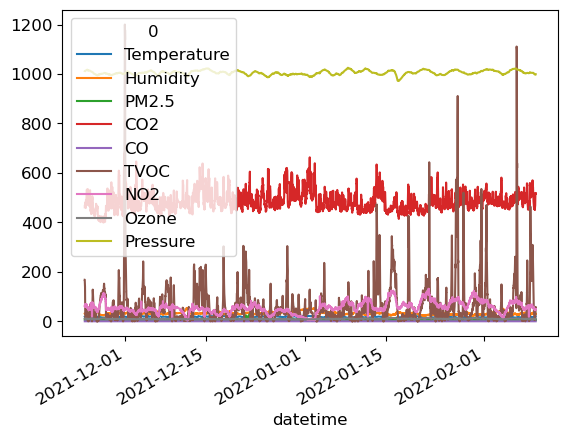

In [130]:
def plot_timeseries(df, cols=numeric_cols):
    df = df.set_index('datetime')
    df[cols].plot.line()

plot_timeseries(train)

In [131]:
from fastbook import *
from sklearn.tree import DecisionTreeRegressor

#!pip install -Uqq dtreeviz
from dtreeviz.trees import *


In [132]:
def try_tree(df, depvar, dropCols=[]):
    xs = df.drop(dropCols+[depvar], axis=1)
    #for col in dropCols:
    #    xs = xs.drop(col, axis=1)
    #xs = train.drop([depvar,'datetime'], axis=1)
    y = df[depvar]

    m = DecisionTreeRegressor(max_leaf_nodes=4)
    m.fit(xs, y)
    g1 = draw_tree(m, xs, size=10, leaves_parallel=True, precision=2);

    samp_idx = np.random.permutation(len(y))[:500]
    g2 = dtreeviz(m, xs.iloc[samp_idx], y.iloc[samp_idx], xs.columns, depvar,
        fontname='DejaVu Sans', scale=1.6, label_fontsize=10,
        orientation='LR');
    
    return g1,g2
    

/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


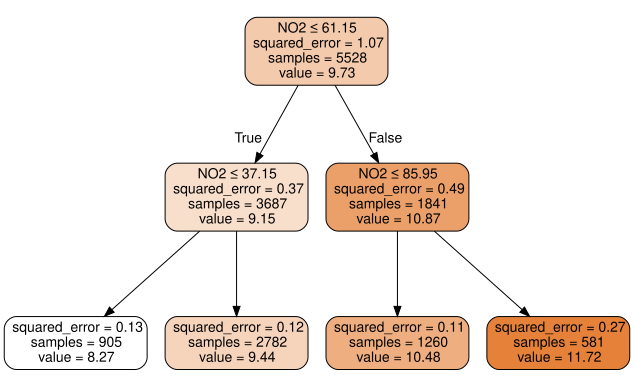

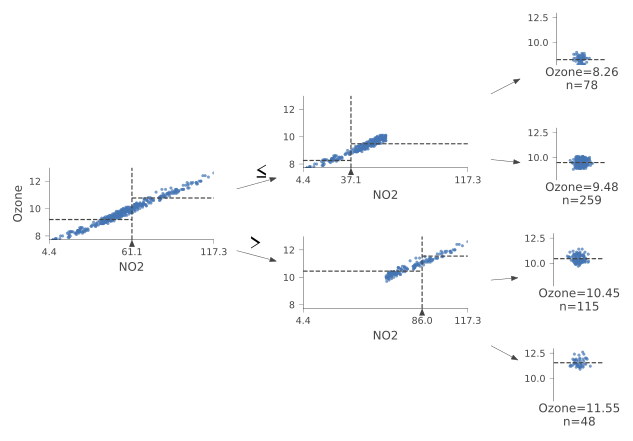

In [133]:
g1, g2 = try_tree(train, 'Ozone', ['datetime','datetimeElapsed','datetimeWeek','datetimeYear'])
display(g1)
display(g2)

Computing Temperature


/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


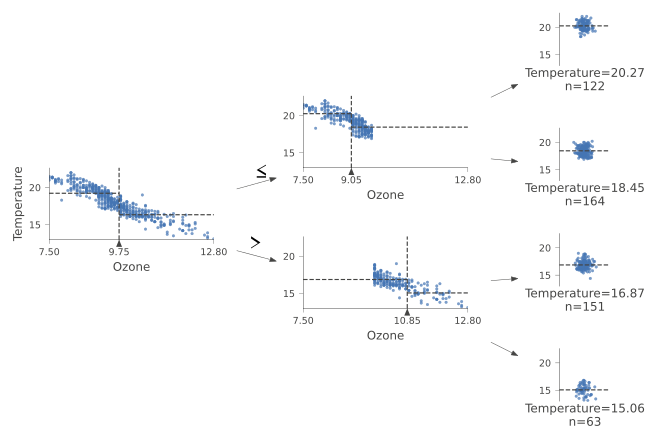

Computing Humidity


/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


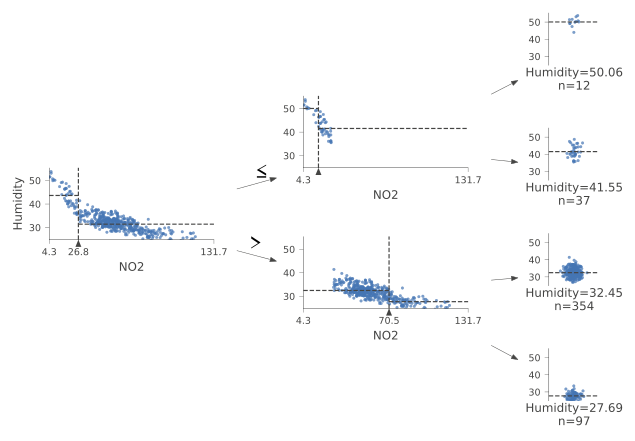

Computing PM2.5


/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


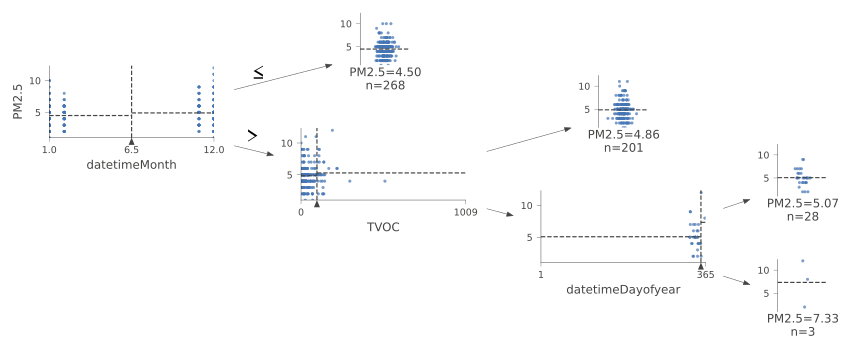

Computing CO2


/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


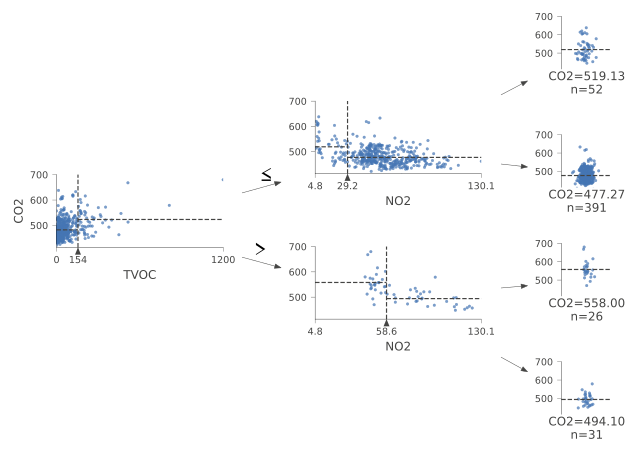

Computing CO


/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(
/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/dtreeviz/trees.py:1239: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(y_range)


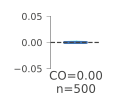

Computing TVOC


/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


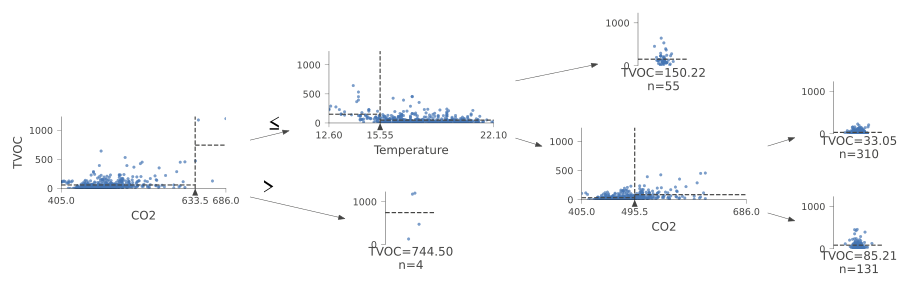

Computing NO2


/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


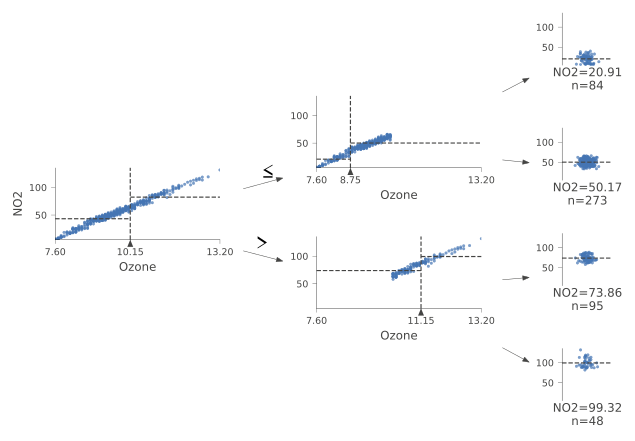

Computing Ozone


/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


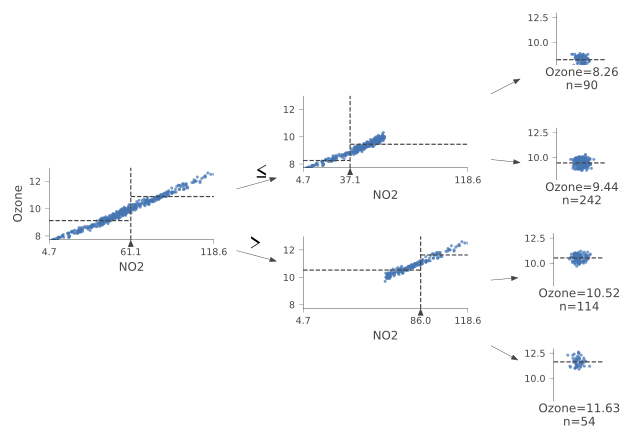

Computing Pressure


/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


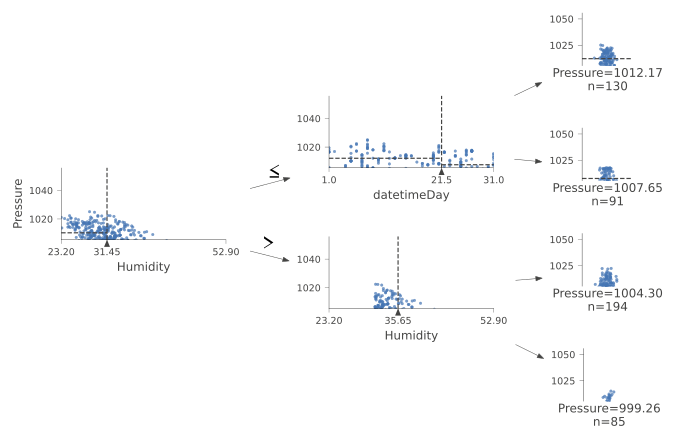

In [134]:
for col in numeric_cols:
    print("Computing", col)
    g1, g2 = try_tree(train, col, ['datetime','datetimeElapsed','datetimeWeek','datetimeYear']);
    display(g2)

# Add WeatherUnderground data

In [135]:
weatherDataFile = "WU_20210401-20210801.txt"
wdf = pd.read_csv('uHoo/'+weatherDataFile, delimiter='\t')
wdf.head()
wdf_cols = [c for c in wdf.columns if c!='Date']

In [136]:

# Convert first column to date type
wdf['Date'] = pd.to_datetime(wdf['Date'], format="%m/%d/%y")

# Set date/time index
wdf = wdf.set_index('Date')
wdf['date'] = wdf.index

In [138]:
wdf.head()

,TempF_Max,TempF_Avg,TempF_Min,DewPointF_Max,DewPointF_Avg,DewPointF_Min,Humidity_Max,Humidity_Avg,Humidity_Min,WindSpeedMPH_Max,WindSpeedMPH_Avg,WindSpeedMPH_Min,PressureIN_Max,PressureIN_Avg,PressureIN_Min,PrecipitationIN_Total,date
Date,,,,,,,,,,,,,,,,,
2021-04-01,49,41.9,33,43,31.0,17,93,67.5,42,30,17.0,5,29.9,29.7,29.6,0.88,2021-04-01
2021-04-02,45,36.8,29,18,13.5,10,56,40.0,26,23,15.4,9,30.0,29.9,29.9,0.00,2021-04-02
2021-04-03,56,41.5,25,21,16.5,13,75,40.2,20,13,4.8,0,30.1,30.0,29.9,0.00,2021-04-03
2021-04-04,72,55.8,35,34,28.0,22,70,38.1,19,17,8.3,0,29.9,29.8,29.6,0.00,2021-04-04
2021-04-05,73,58.7,38,39,31.9,26,76,39.5,22,10,6.1,0,29.8,29.7,29.6,0.00,2021-04-05


In [139]:
df1['date'] = pd.to_datetime(df1['datetime'].dt.date)
# Ignore the SettingWithCopyError... it still works

SettingWithCopyError: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

In [157]:
# Create merged data set
mdf = df1.merge(wdf, on=["date"], how="outer")

# Add rain prediction column
mdf['Rain'] = np.where(mdf['PrecipitationIN_Total']>0.0, True, False)

# Drop useless columns
mdf = mdf.drop(['datetime','date'], axis=1)

# Show
mdf.head()


,Temperature,Humidity,PM2.5,CO2,CO,TVOC,NO2,Ozone,Pressure,TempF_Max,TempF_Avg,TempF_Min,DewPointF_Max,DewPointF_Avg,DewPointF_Min,Humidity_Max,Humidity_Avg,Humidity_Min,WindSpeedMPH_Max,WindSpeedMPH_Avg,WindSpeedMPH_Min,PressureIN_Max,PressureIN_Avg,PressureIN_Min,PrecipitationIN_Total,Rain
0,22.8,40.7,1.0,951,0.0,78,3.1,7.1,994.1,49,41.9,33,43,31.0,17,93,67.5,42,30,17.0,5,29.9,29.7,29.6,0.88,True
1,22.8,40.5,1.0,955,0.0,77,3.0,7.1,994.0,49,41.9,33,43,31.0,17,93,67.5,42,30,17.0,5,29.9,29.7,29.6,0.88,True
2,22.8,40.6,1.0,959,0.0,71,4.7,7.2,994.2,49,41.9,33,43,31.0,17,93,67.5,42,30,17.0,5,29.9,29.7,29.6,0.88,True
3,22.5,40.7,1.0,928,0.0,37,4.2,7.2,994.3,49,41.9,33,43,31.0,17,93,67.5,42,30,17.0,5,29.9,29.7,29.6,0.88,True
4,22.6,40.7,1.0,934,0.0,38,4.9,7.2,994.3,49,41.9,33,43,31.0,17,93,67.5,42,30,17.0,5,29.9,29.7,29.6,0.88,True


In [158]:
train, valid, test = cutDataSet(mdf)

train

Total rows:  8667
Train cut:  6933
Valid cut:  7800
Test cut:  8667


,Temperature,Humidity,PM2.5,CO2,CO,TVOC,NO2,Ozone,Pressure,TempF_Max,TempF_Avg,TempF_Min,DewPointF_Max,DewPointF_Avg,DewPointF_Min,Humidity_Max,Humidity_Avg,Humidity_Min,WindSpeedMPH_Max,WindSpeedMPH_Avg,WindSpeedMPH_Min,PressureIN_Max,PressureIN_Avg,PressureIN_Min,PrecipitationIN_Total,Rain
0,22.8,40.7,1.0,951,0.0,78,3.1,7.1,994.1,49,41.9,33,43,31.0,17,93,67.5,42,30,17.0,5,29.9,29.7,29.6,0.88,True
1,22.8,40.5,1.0,955,0.0,77,3.0,7.1,994.0,49,41.9,33,43,31.0,17,93,67.5,42,30,17.0,5,29.9,29.7,29.6,0.88,True
2,22.8,40.6,1.0,959,0.0,71,4.7,7.2,994.2,49,41.9,33,43,31.0,17,93,67.5,42,30,17.0,5,29.9,29.7,29.6,0.88,True
3,22.5,40.7,1.0,928,0.0,37,4.2,7.2,994.3,49,41.9,33,43,31.0,17,93,67.5,42,30,17.0,5,29.9,29.7,29.6,0.88,True
4,22.6,40.7,1.0,934,0.0,38,4.9,7.2,994.3,49,41.9,33,43,31.0,17,93,67.5,42,30,17.0,5,29.9,29.7,29.6,0.88,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6928,23.2,54.0,1.0,792,0.0,68,0.0,6.9,998.2,95,82.8,71,75,70.9,66,90,68.5,47,12,3.5,0,29.7,29.6,29.6,0.00,False
6929,23.2,53.9,1.0,793,0.0,67,0.1,6.8,998.3,95,82.8,71,75,70.9,66,90,68.5,47,12,3.5,0,29.7,29.6,29.6,0.00,False
6930,23.2,53.9,1.0,784,0.0,66,0.8,6.9,998.3,95,82.8,71,75,70.9,66,90,68.5,47,12,3.5,0,29.7,29.6,29.6,0.00,False
6931,23.3,53.4,1.0,753,0.0,54,0.6,6.9,997.9,95,82.8,71,75,70.9,66,90,68.5,47,12,3.5,0,29.7,29.6,29.6,0.00,False


Total rows:  8667
Train cut:  6933
Valid cut:  7800
Test cut:  8667


/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


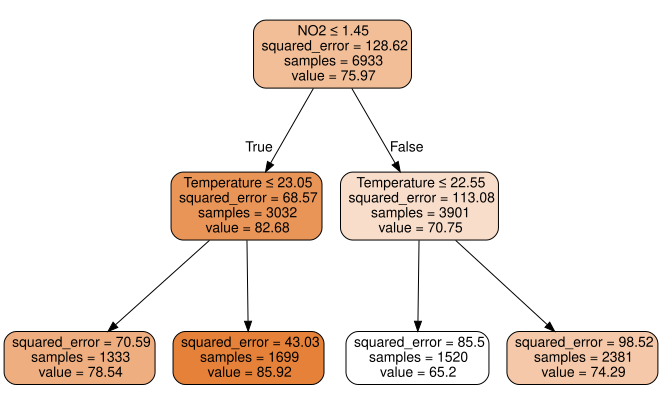

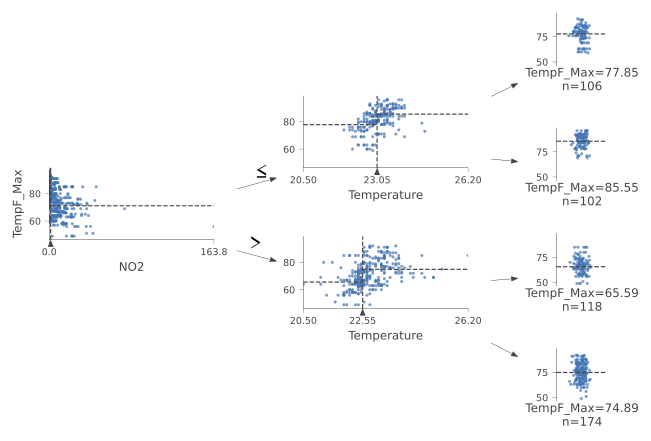

/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


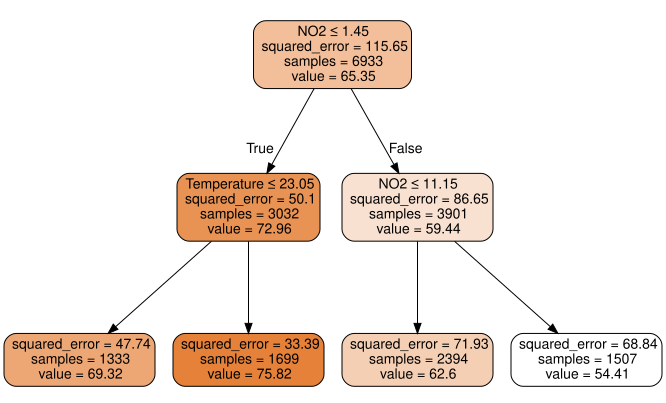

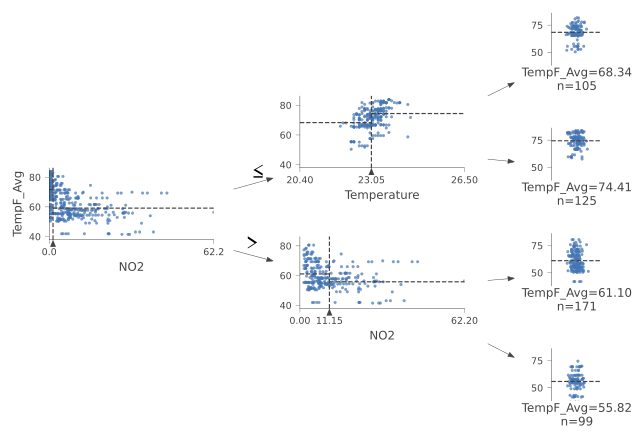

/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


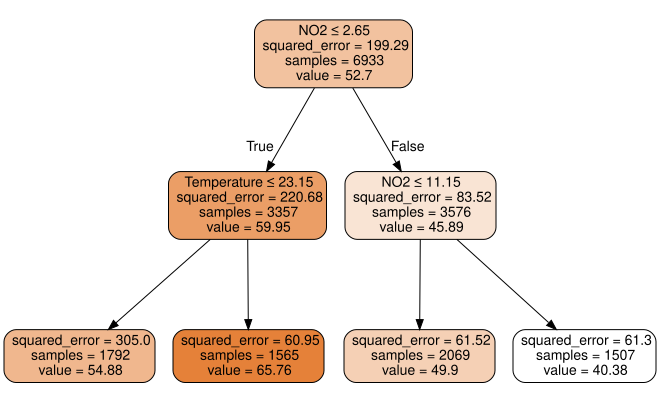

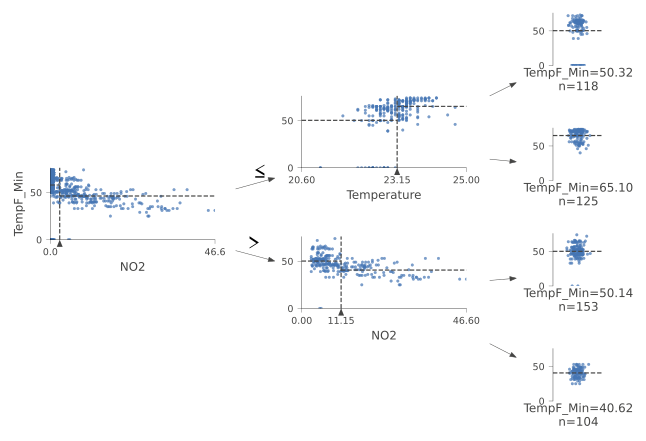

/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


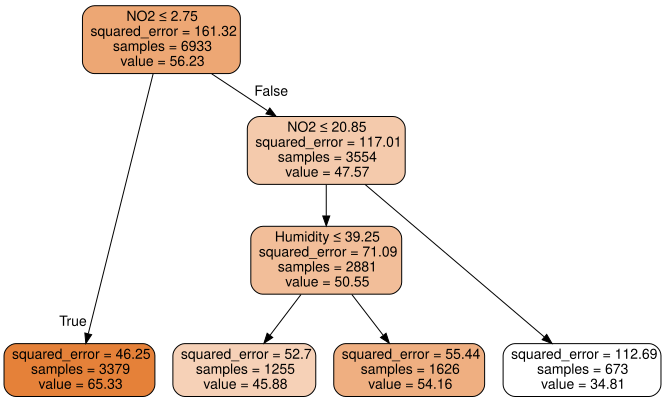

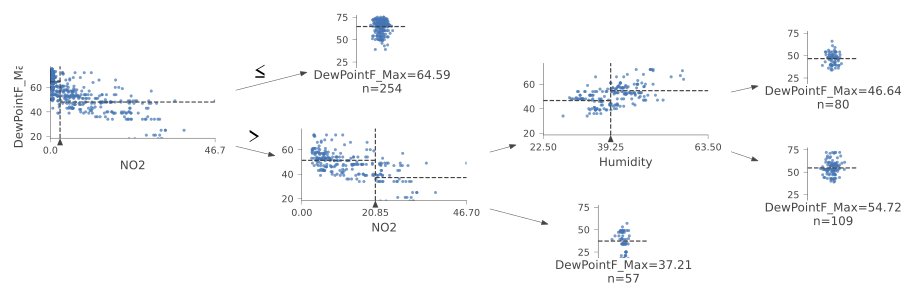

/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


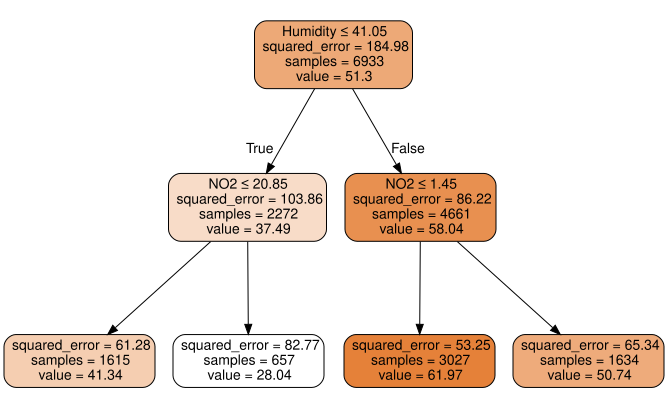

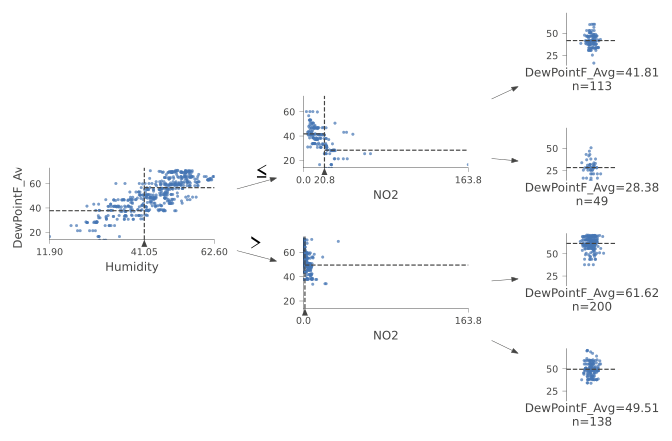

/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


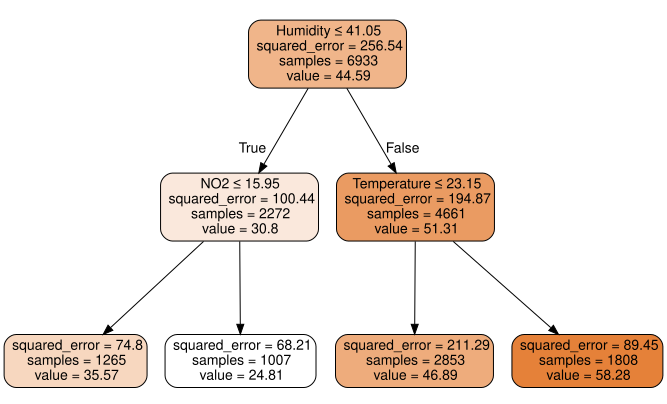

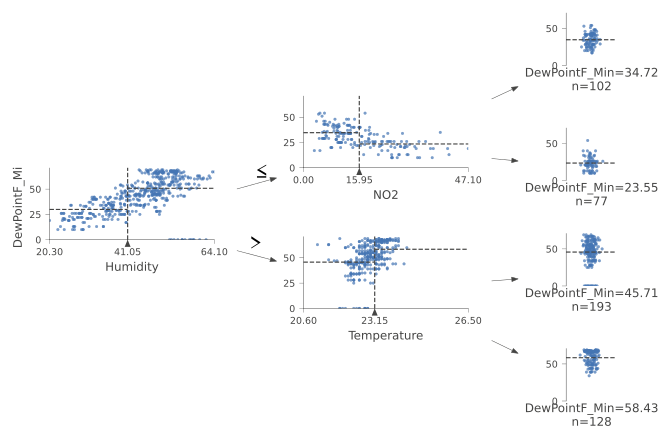

/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


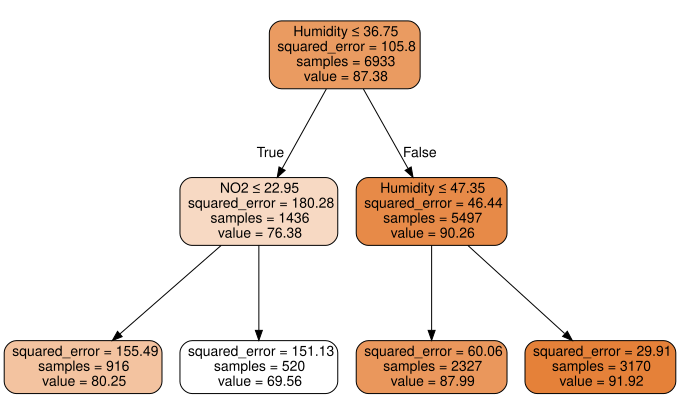

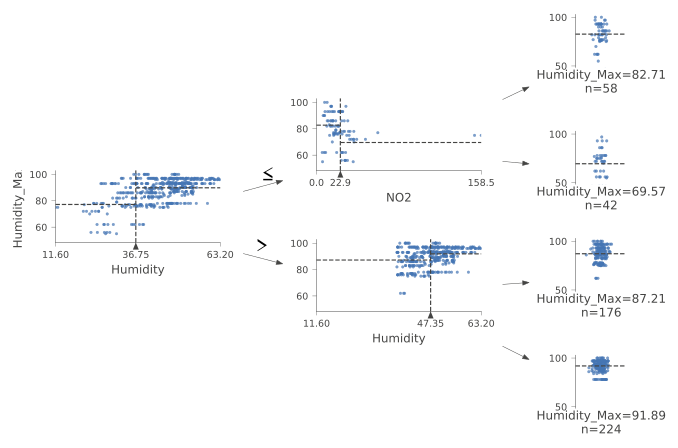

/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


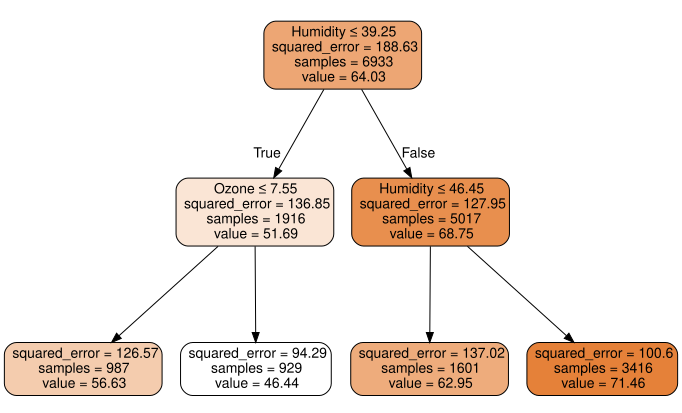

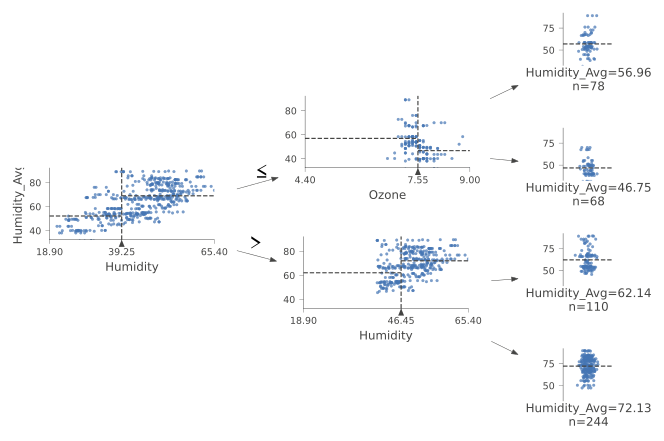

/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


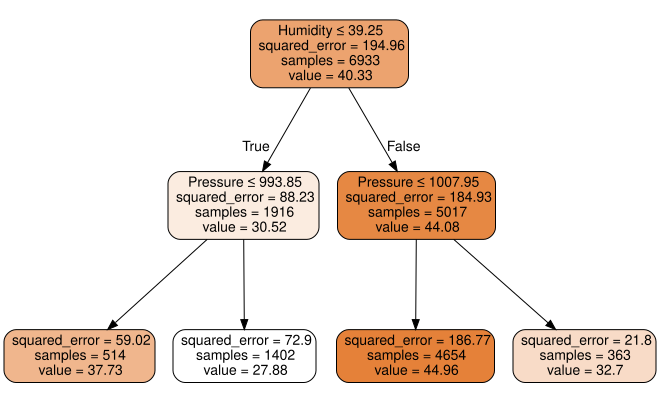

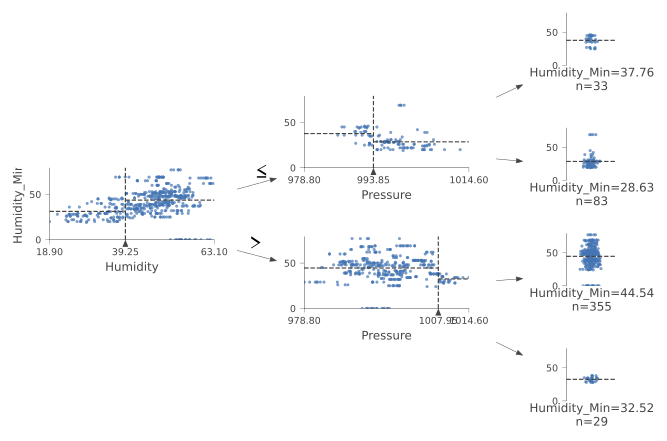

/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


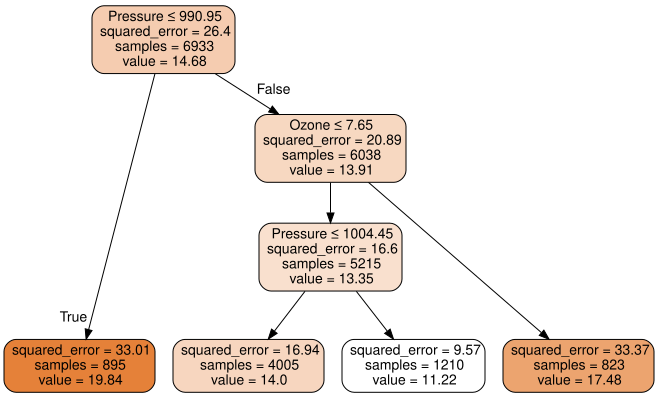

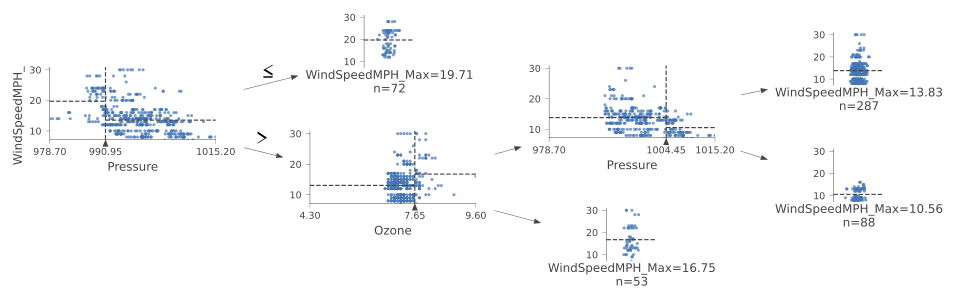

/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


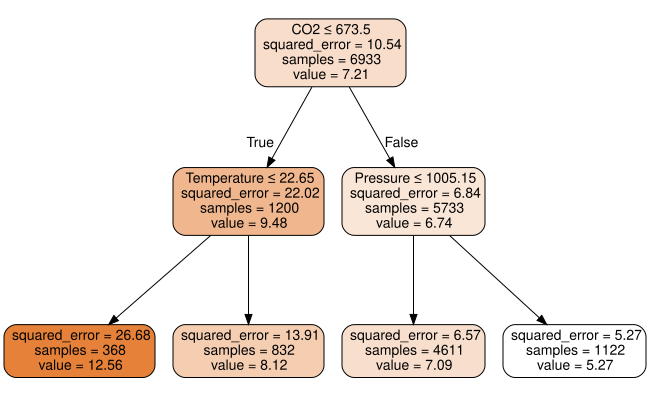

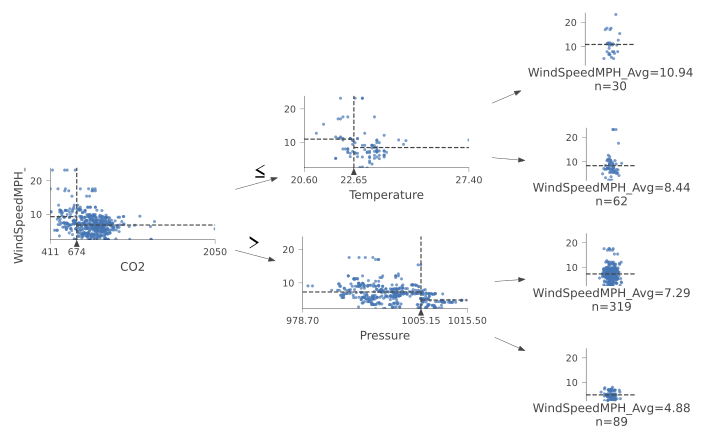

/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


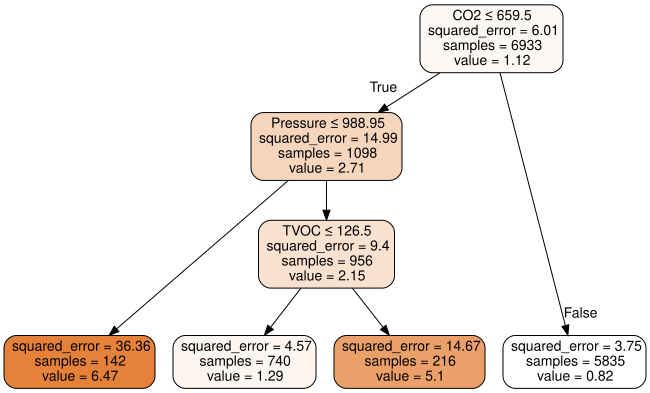

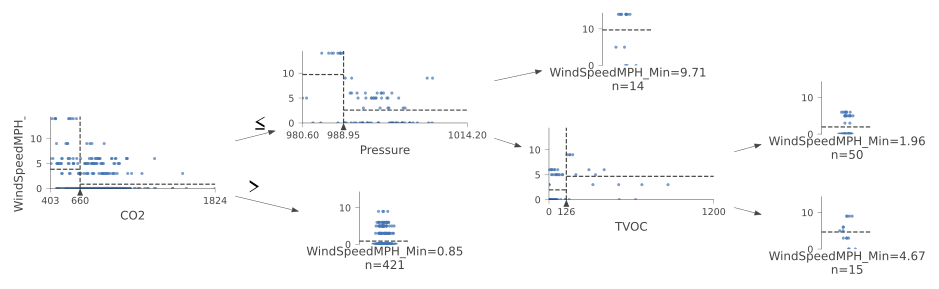

/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


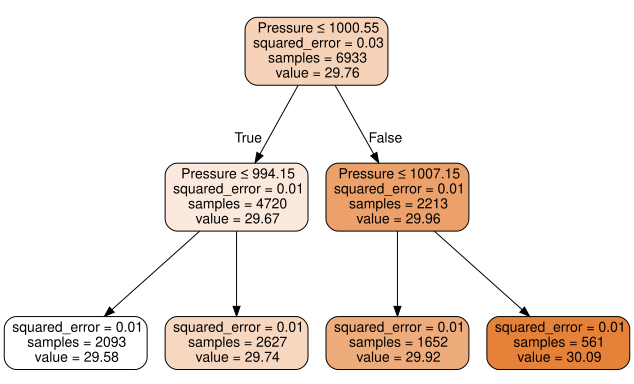

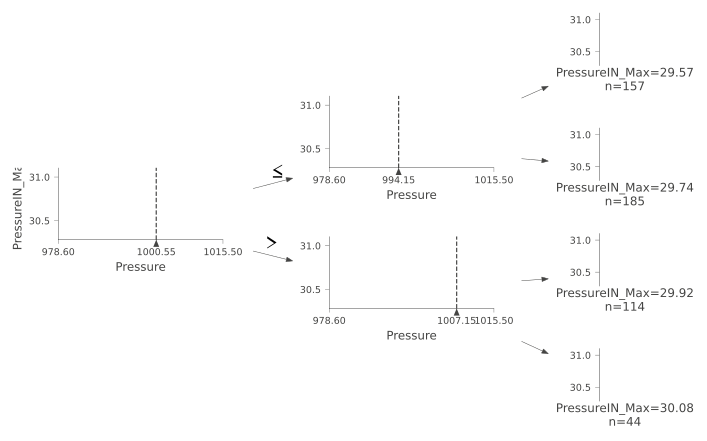

/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


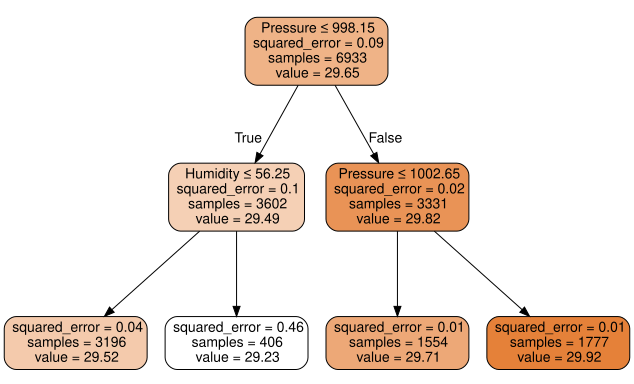

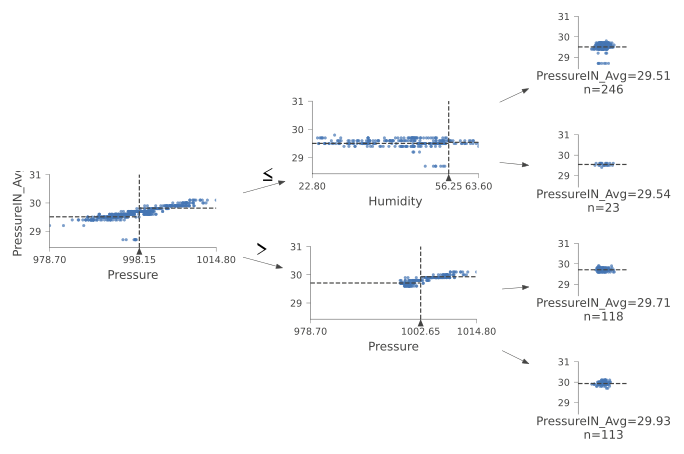

/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


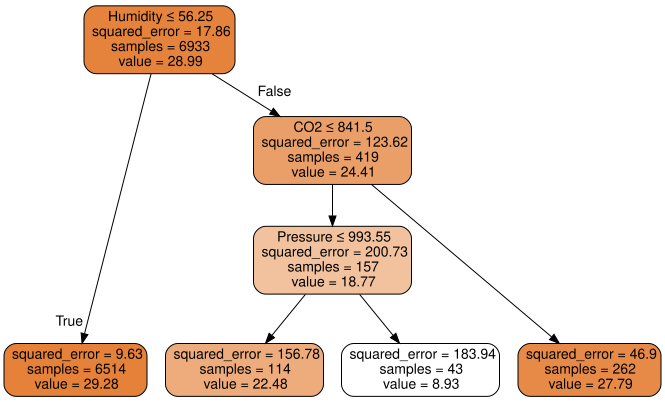

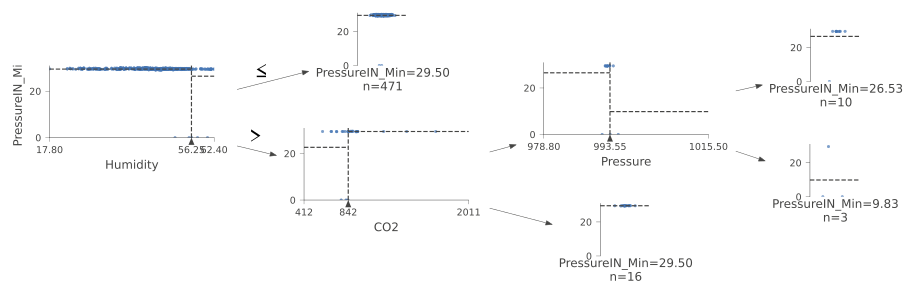

/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


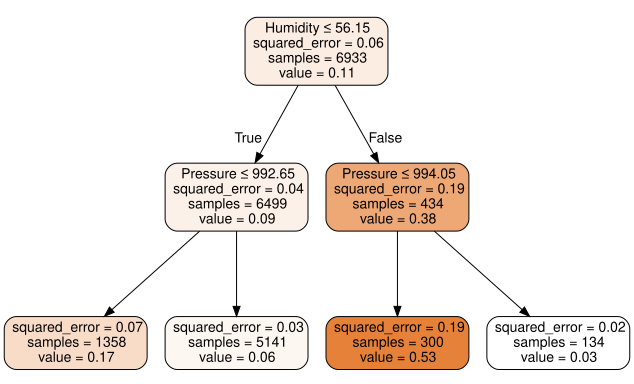

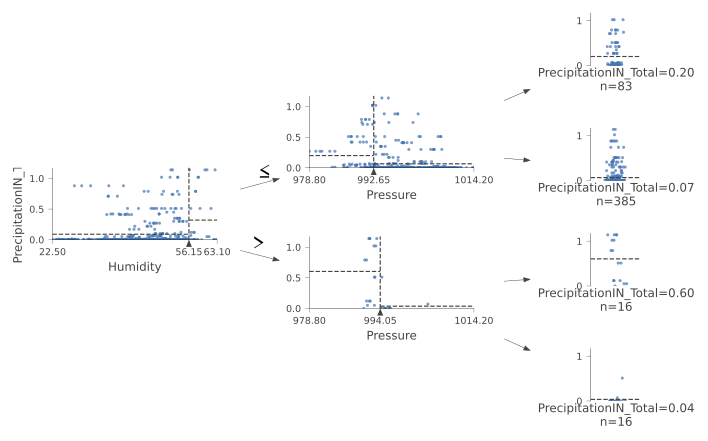

In [70]:
for col in wdf_cols:
    print("Computing", col)
    g1, g2 = try_tree(train, col, ['datetime','date']+wdf_cols);
    display(g1)
    display(g2)

In [160]:
indoor_cols = numeric_cols
print('Indoor:',indoor_cols)
outdoor_cols = wdf_cols+['Rain']
print('Outdoor:',outdoor_cols)

# indoor pressure in hectoPascals (millibars)
# outdoor pressure in "sea-level pressure"

Indoor: ['Temperature', 'Humidity', 'PM2.5', 'CO2', 'CO', 'TVOC', 'NO2', 'Ozone', 'Pressure']
Outdoor: ['TempF_Max', 'TempF_Avg', 'TempF_Min', 'DewPointF_Max', 'DewPointF_Avg', 'DewPointF_Min', 'Humidity_Max', 'Humidity_Avg', 'Humidity_Min', 'WindSpeedMPH_Max', 'WindSpeedMPH_Avg', 'WindSpeedMPH_Min', 'PressureIN_Max', 'PressureIN_Avg', 'PressureIN_Min', 'PrecipitationIN_Total', 'Rain']


In [161]:
from fastai.tabular.all import *
splits = (list(train.index), list(valid.index))

In [206]:
# Based on https://docs.fast.ai/tutorial.tabular.html
 
dep_var='Pressure'

x_names = [c for c in indoor_cols if c!=dep_var] \
    + [c for c in outdoor_cols if c!='Rain' and c!=dep_var]
print(x_names)

to = TabularPandas(mdf, procs=[Categorify, FillMissing, Normalize],
                   cat_names = ['Rain'],
                   cont_names = x_names,
                   y_names=dep_var,
                   splits=splits)

['Temperature', 'Humidity', 'PM2.5', 'CO2', 'CO', 'TVOC', 'NO2', 'Ozone', 'TempF_Max', 'TempF_Avg', 'TempF_Min', 'DewPointF_Max', 'DewPointF_Avg', 'DewPointF_Min', 'Humidity_Max', 'Humidity_Avg', 'Humidity_Min', 'WindSpeedMPH_Max', 'WindSpeedMPH_Avg', 'WindSpeedMPH_Min', 'PressureIN_Max', 'PressureIN_Avg', 'PressureIN_Min', 'PrecipitationIN_Total']


In [207]:
print(len(x_names))

mdf

24


,Temperature,Humidity,PM2.5,CO2,CO,TVOC,NO2,Ozone,Pressure,TempF_Max,TempF_Avg,TempF_Min,DewPointF_Max,DewPointF_Avg,DewPointF_Min,Humidity_Max,Humidity_Avg,Humidity_Min,WindSpeedMPH_Max,WindSpeedMPH_Avg,WindSpeedMPH_Min,PressureIN_Max,PressureIN_Avg,PressureIN_Min,PrecipitationIN_Total,Rain
0,22.8,40.7,1.0,951,0.0,78,3.1,7.1,994.1,49,41.9,33,43,31.0,17,93,67.5,42,30,17.0,5,29.9,29.7,29.6,0.88,True
1,22.8,40.5,1.0,955,0.0,77,3.0,7.1,994.0,49,41.9,33,43,31.0,17,93,67.5,42,30,17.0,5,29.9,29.7,29.6,0.88,True
2,22.8,40.6,1.0,959,0.0,71,4.7,7.2,994.2,49,41.9,33,43,31.0,17,93,67.5,42,30,17.0,5,29.9,29.7,29.6,0.88,True
3,22.5,40.7,1.0,928,0.0,37,4.2,7.2,994.3,49,41.9,33,43,31.0,17,93,67.5,42,30,17.0,5,29.9,29.7,29.6,0.88,True
4,22.6,40.7,1.0,934,0.0,38,4.9,7.2,994.3,49,41.9,33,43,31.0,17,93,67.5,42,30,17.0,5,29.9,29.7,29.6,0.88,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8662,22.2,50.2,1.0,1068,0.0,158,0.0,7.2,995.8,83,74.0,67,62,57.0,53,68,55.9,42,8,5.5,0,29.7,29.6,29.6,0.00,False
8663,22.2,50.2,1.0,1071,0.0,158,0.4,7.2,995.8,83,74.0,67,62,57.0,53,68,55.9,42,8,5.5,0,29.7,29.6,29.6,0.00,False
8664,22.3,47.5,1.0,997,0.0,147,0.6,7.2,995.7,83,74.0,67,62,57.0,53,68,55.9,42,8,5.5,0,29.7,29.6,29.6,0.00,False
8665,22.3,50.7,1.0,998,0.0,142,0.6,7.2,995.7,83,74.0,67,62,57.0,53,68,55.9,42,8,5.5,0,29.7,29.6,29.6,0.00,False


In [208]:
dls = to.dataloaders(bs=64)

dls.show_batch()

,Rain,Temperature,Humidity,PM2.5,CO2,CO,TVOC,NO2,Ozone,TempF_Max,TempF_Avg,TempF_Min,DewPointF_Max,DewPointF_Avg,DewPointF_Min,Humidity_Max,Humidity_Avg,Humidity_Min,WindSpeedMPH_Max,WindSpeedMPH_Avg,WindSpeedMPH_Min,PressureIN_Max,PressureIN_Avg,PressureIN_Min,PrecipitationIN_Total,Pressure
0,False,23.600000,40.500000,1.0,819.000000,-8.215089e-10,6.999997,4.900000,7.2,87.0,75.800003,59.000000,61.000000,56.700001,54.000000,87.0,54.400001,33.000000,10.0,5.6,2.929370e-08,29.600000,29.600000,29.500000,-2.221384e-09,995.299988
1,False,22.799999,47.099998,1.0,714.999999,-8.215089e-10,26.000006,3.900000,7.4,80.0,71.300003,63.000000,61.000000,59.299999,57.000000,84.0,67.000000,48.000000,14.0,8.9,5.000000e+00,29.900000,29.799999,29.799999,-2.221384e-09,1001.299988
2,True,20.400000,30.700001,1.0,756.000000,-8.215089e-10,436.000000,27.299999,8.0,69.0,56.400001,46.000000,34.000000,25.500001,21.000000,47.0,31.500002,19.999999,26.0,12.7,5.000000e+00,29.799999,29.600000,29.600000,9.999999e-03,1000.200012
3,True,22.299999,48.700001,1.0,741.999999,-8.215089e-10,67.000003,3.900000,7.4,57.0,51.999999,50.000000,47.000000,45.700001,45.000000,89.0,79.300003,69.000000,15.0,9.3,2.929370e-08,29.900000,29.799999,29.799999,1.000000e-01,1002.900024
4,False,23.400000,26.200000,1.0,856.000000,-8.215089e-10,1200.000013,22.299999,7.5,63.0,50.700001,35.000001,48.000000,38.000000,30.000000,93.0,67.699997,29.000000,10.0,2.8,2.929370e-08,29.799999,29.600000,29.500000,-2.221384e-09,999.099976
5,False,23.000000,43.099998,1.0,705.000000,-8.215089e-10,41.000003,1.600000,7.1,78.0,66.800003,50.000000,50.000000,43.900002,39.000000,83.0,47.299999,25.000000,14.0,5.8,2.929370e-08,29.700001,29.700001,29.600000,-2.221384e-09,998.099976
6,False,22.700001,37.099999,1.0,955.000004,-8.215089e-10,37.000003,12.000000,7.5,73.0,57.800000,40.000000,40.999999,38.000000,34.000000,93.0,53.800000,25.000000,9.0,3.5,2.929370e-08,29.900000,29.900000,29.900000,-2.221384e-09,1005.900024
7,False,23.900000,26.200000,2.0,902.000000,-8.215089e-10,167.000000,26.600000,7.7,56.0,41.500000,24.999999,21.000001,16.499998,13.000000,75.0,40.200000,19.999999,13.0,4.8,2.929370e-08,30.100000,30.000000,29.900000,-2.221384e-09,1006.799988
8,False,24.100000,27.700001,1.0,505.999996,-8.215089e-10,78.000000,15.500000,7.2,72.0,55.800000,35.000001,34.000000,27.999999,21.999999,70.0,38.099998,19.000000,17.0,8.3,2.929370e-08,29.900000,29.799999,29.600000,-2.221384e-09,997.400024
9,False,22.900000,47.200001,1.0,943.999998,-8.215089e-10,86.000000,3.300000,7.3,78.0,67.000000,52.000000,60.000000,55.400002,49.000000,89.0,68.000000,48.000000,13.0,6.8,2.929370e-08,29.900000,29.900000,29.900000,-2.221384e-09,1006.299988


SuggestedLRs(valley=0.03981071710586548)

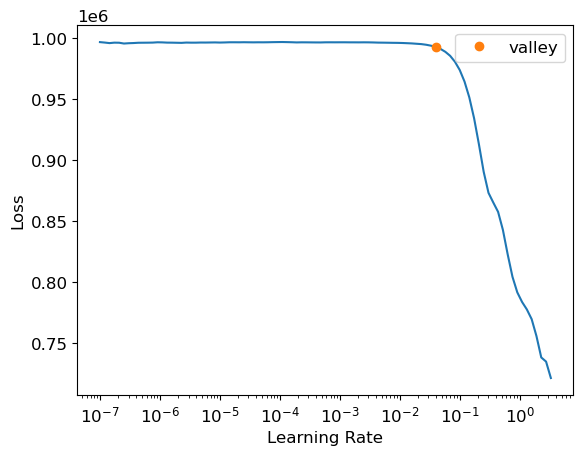

In [196]:
learn = tabular_learner(dls, loss_func=F.mse_loss, metrics=accuracy, layers=[500,250])
learn.lr_find()

In [176]:
#learn.fit_one_cycle(1)
learn.fit(n_epoch=10)

epoch,train_loss,valid_loss,accuracy,time
0,690682.937500,662283.437500,0.000000,00:00
1,617603.000000,581739.562500,0.000000,00:00
2,535677.250000,498234.625000,0.000000,00:00
3,451715.625000,411374.750000,0.000000,00:00
4,368640.000000,333032.218750,0.000000,00:00
5,289338.906250,253493.671875,0.000000,00:00
6,216057.781250,183941.593750,0.000000,00:00
7,151083.687500,124384.210938,0.000000,00:00
8,96400.976562,73767.421875,0.000000,00:00
9,53834.125000,37228.808594,0.000000,00:00


In [ ]:
learn.show_results()

/Users/rokickik/opt/miniconda3/envs/course23/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


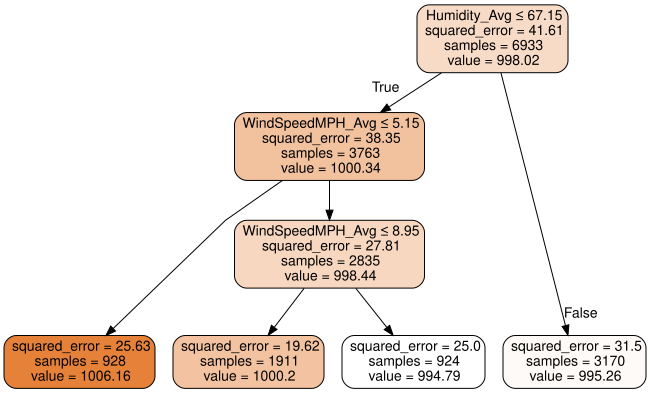

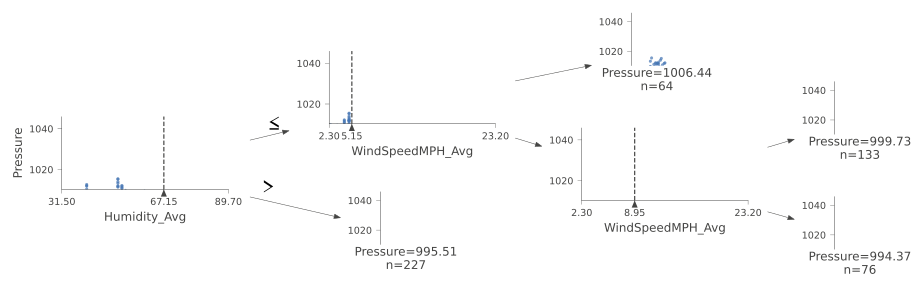

In [163]:
g1, g2 = try_tree(train, 'Pressure', ['Pressure','PressureIN_Avg','PressureIN_Min','PressureIN_Max']);
display(g1)
display(g2)